## Libraries

In [6]:
import matplotlib.pyplot as plt
import pandas as pd

from pathlib import Path

from scipy.stats import cauchy

## Data Loading

In [2]:
spec_dir = Path("../input/atma5/spectrum/")
fitting_dir = Path("../input/atma5/spectrum_from_fitting/")

train = pd.read_csv("../input/atma5/train.csv")
test = pd.read_csv("../input/atma5/test.csv")

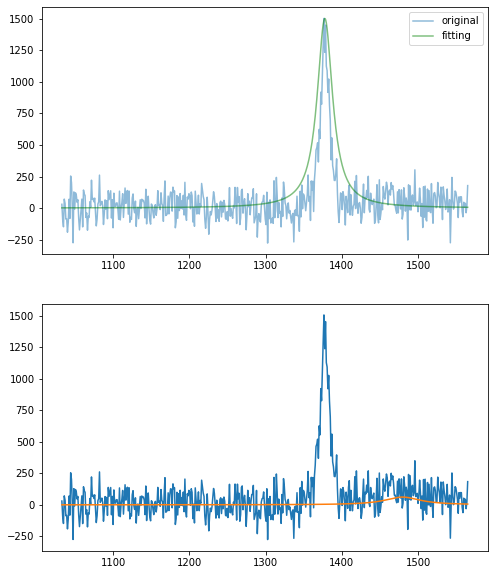

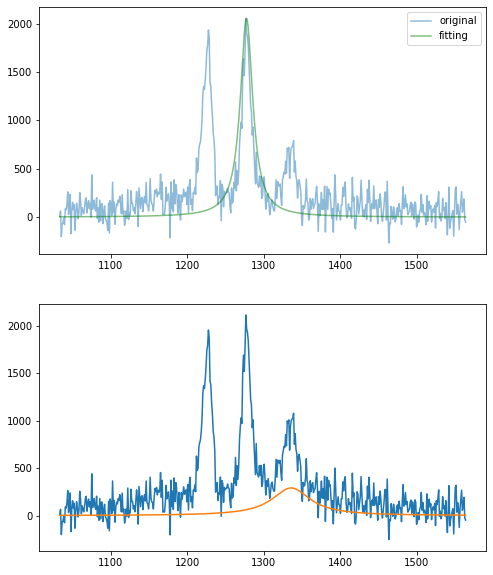

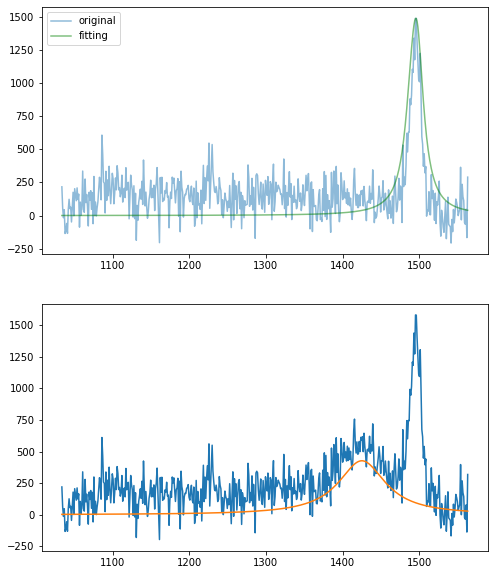

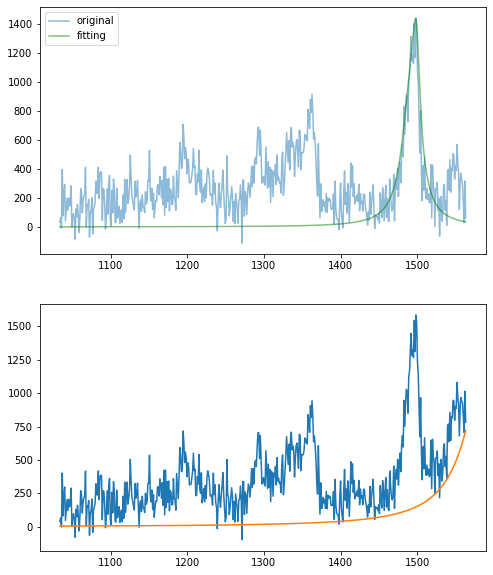

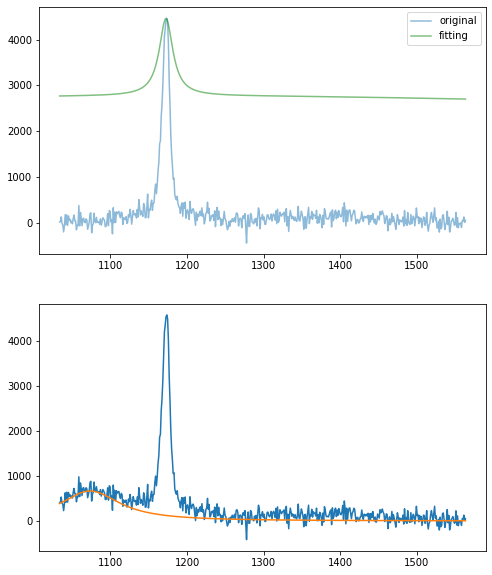

...

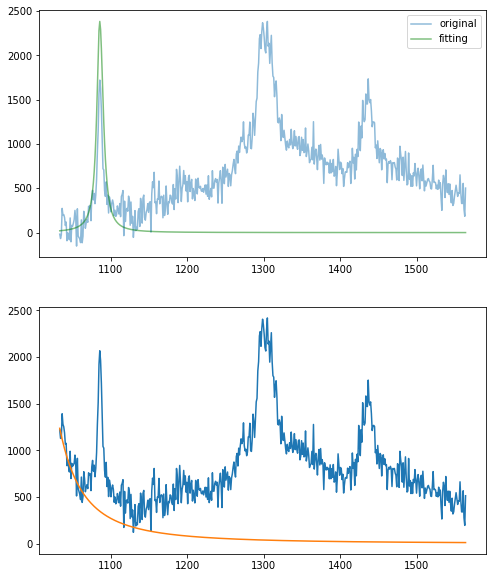

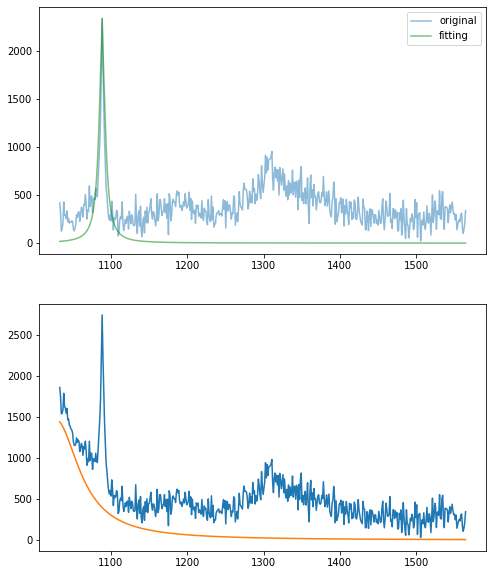

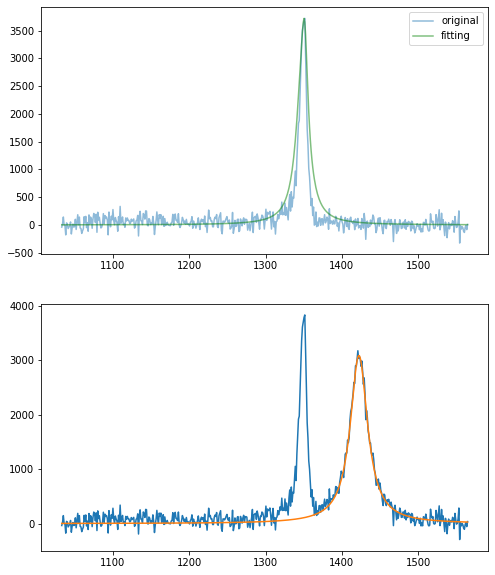

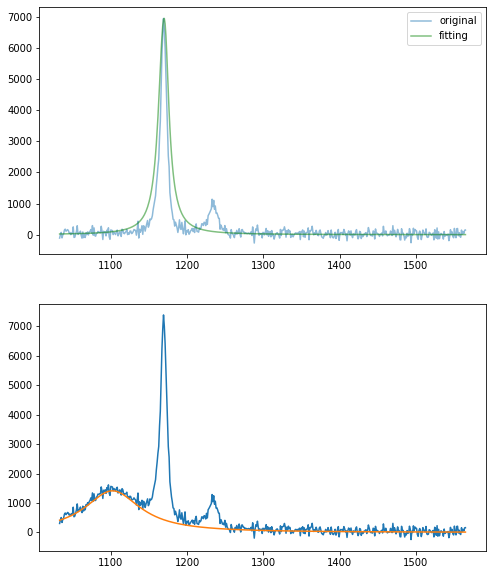

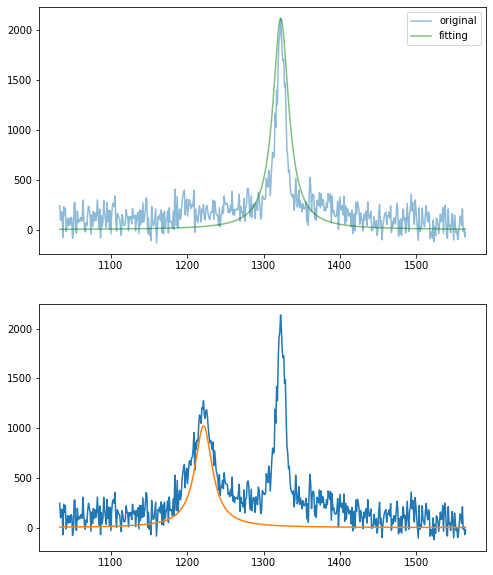

In [33]:
for i in range(100):
    fname = test.loc[i, "spectrum_filename"]
    spec = pd.read_csv(spec_dir / fname, sep="\t", header=None)
    fitting = pd.read_csv(fitting_dir / fname, sep="\t", header=None)
    
    idxmax = fitting[1].values.argmax()
    sign = 1 if np.random.rand() > 0.5 else -1
    peak_pos = fitting[0].values[idxmax] + np.random.randint(50, 150) * sign
    scale = np.abs(np.random.normal() * 40)
    
    false_peak = cauchy.pdf(spec[0].values, peak_pos, scale)
    ratio = spec[1].max() / false_peak.max()
    false_peak = false_peak * ratio * np.random.rand()
    
    fig = plt.figure(figsize=(8, 10))
    ax = fig.add_subplot(2, 1, 1)
    ax.plot(spec[0], spec[1], label="original", alpha=0.5)
    ax.plot(fitting[0], fitting[1], label="fitting", alpha=0.5, c="g")
    ax.legend()
    
    ax2 = fig.add_subplot(2, 1, 2)
    ax2.plot(spec[0], spec[1].values + false_peak)
    ax2.plot(spec[0], false_peak)
    plt.show()

In [31]:
peak_pos

1495.47

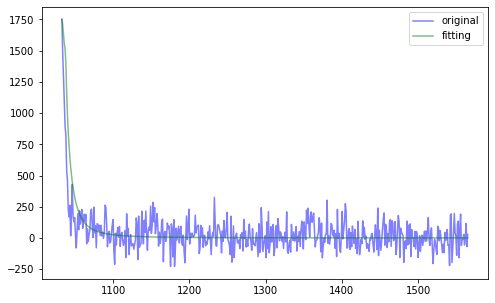

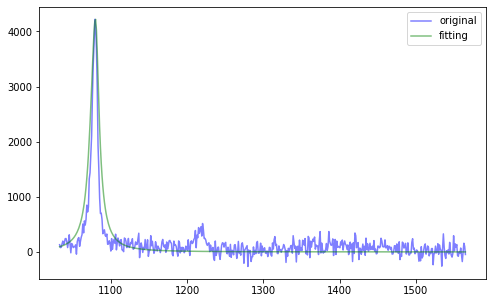

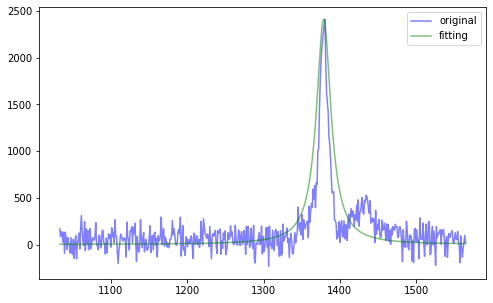

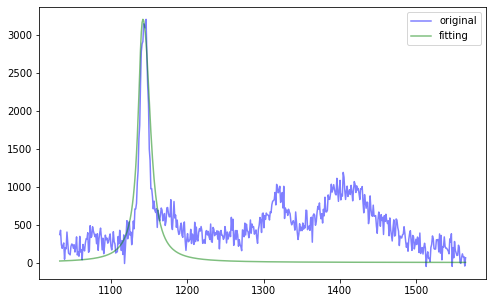

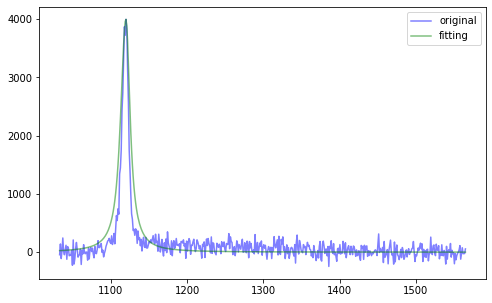

...

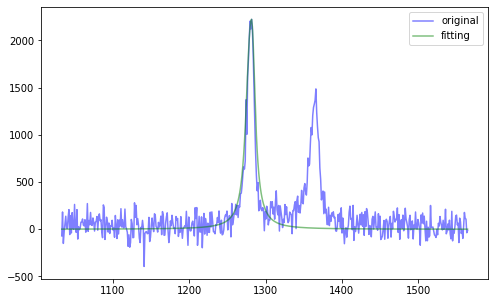

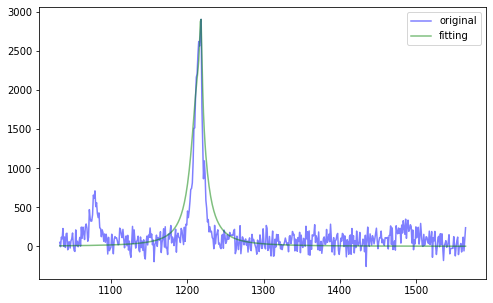

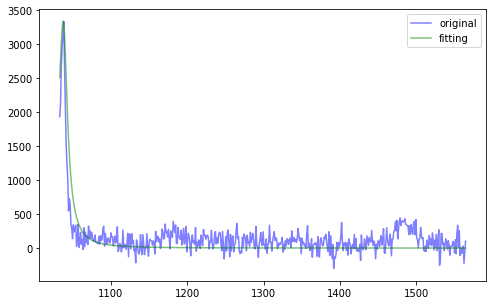

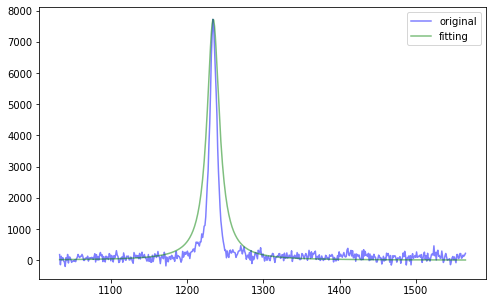

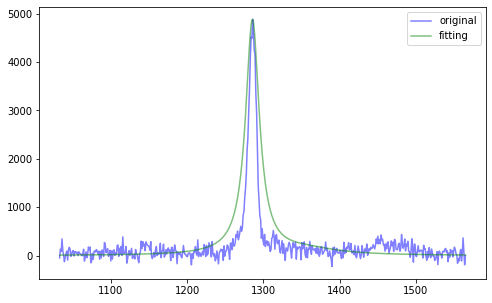

In [4]:
for i in range(100):
    fname = train.loc[i, "spectrum_filename"]
    spec = pd.read_csv(spec_dir / fname, sep="\t", header=None)
    fitting = pd.read_csv(fitting_dir / fname, sep="\t", header=None)
    
    color = "r" if train.loc[i, "target"] == 1 else "b"
    plt.figure(figsize=(8, 5))
    plt.plot(spec[0], spec[1], label="original", alpha=0.5, c=color)
    plt.plot(fitting[0], fitting[1], label="fitting", alpha=0.5, c="g")
    plt.legend()
    plt.show()